In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
from shapely.geometry import Point, Polygon

c:\program files\python37\lib\site-packages\pyproj\crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


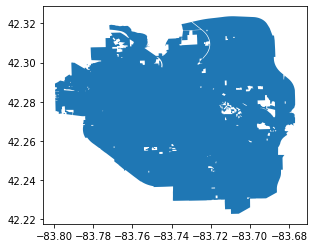

In [2]:
sf_path = "maps/gis_osm_landuse_a_free_1.shp"
sf = gpd.read_file(sf_path, encoding='utf-8')
sf.head()  
sf_path = "maps/AA_City_Boundary.shp"
sf = gpd.read_file(sf_path, encoding='utf-8')
stgo_shape = sf.to_crs({'init': 'epsg:4326'})
stgo_shape.plot()

In [3]:
stgo_shape.total_bounds
stgo_shape.centroid

0    POINT (-83.73122 42.27577)
dtype: geometry

In [4]:
roads_path = "maps/gis_osm_roads_free_1.shp"
roads = gpd.read_file(roads_path, encoding='utf-8')

c:\program files\python37\lib\site-packages\numpy\lib\function_base.py:2167: RuntimeWarning: invalid value encountered in ? (vectorized)
  outputs = ufunc(*inputs)


footway           10085
service            4567
residential        1911
tertiary            557
secondary           377
steps               265
cycleway            222
path                182
primary             130
unclassified        124
motorway             76
secondary_link       60
motorway_link        57
living_street        19
track                12
pedestrian            9
tertiary_link         8
primary_link          7
Name: fclass, dtype: int64

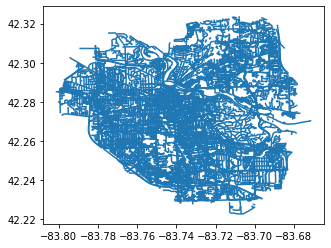

In [5]:
roads = gpd.sjoin(roads, stgo_shape, op='intersects')
roads.plot()
roads.fclass.value_counts()

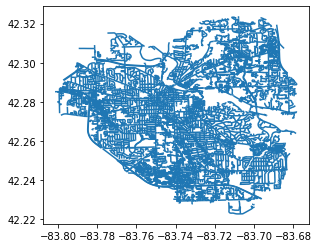

In [6]:
car_roads = roads
car_roads = car_roads[(car_roads.fclass == 'service') |
                       (car_roads.fclass == 'residential') |
                       (car_roads.fclass == 'tertiary') |
                       (car_roads.fclass == 'secondary') |
                       (car_roads.fclass == 'primary') |
                       (car_roads.fclass == 'motorway') |
                       (car_roads.fclass == 'secondary_link') |
                       (car_roads.fclass == 'motorway_link') |
                       (car_roads.fclass == 'living_street') |
                       (car_roads.fclass == 'tertiary_link') |
                       (car_roads.fclass == 'primary_link')
                      ]
car_roads.plot()

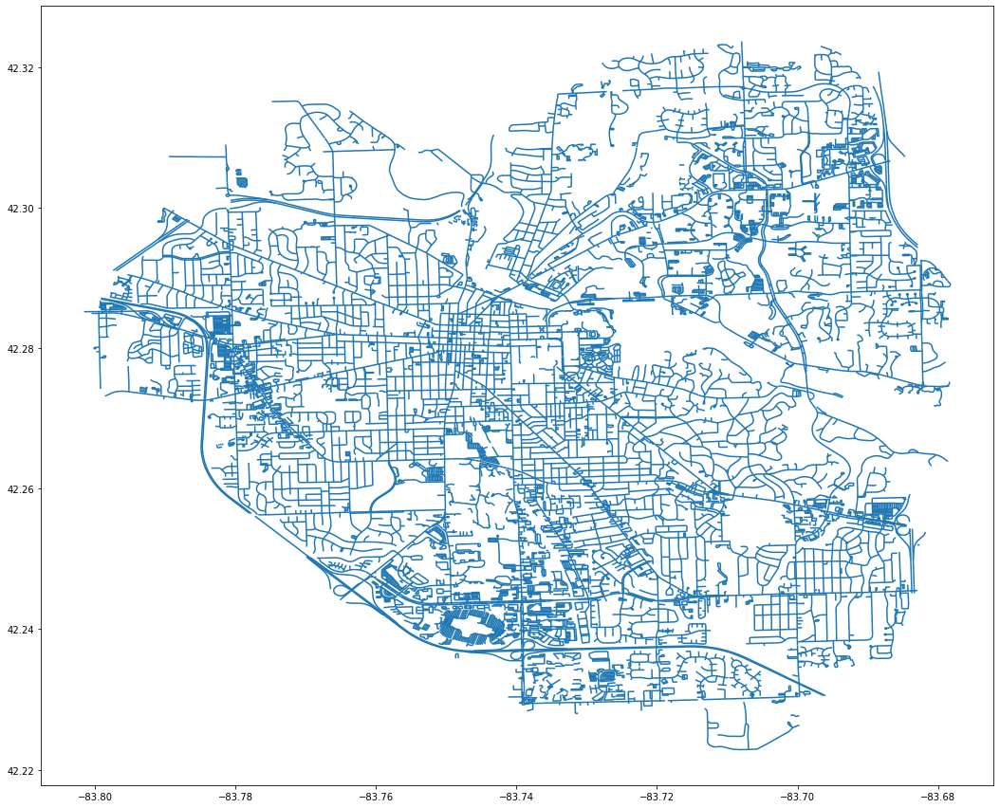

In [7]:
fig, ax = plt.subplots(figsize = (18, 18))
car_roads.plot(ax = ax)

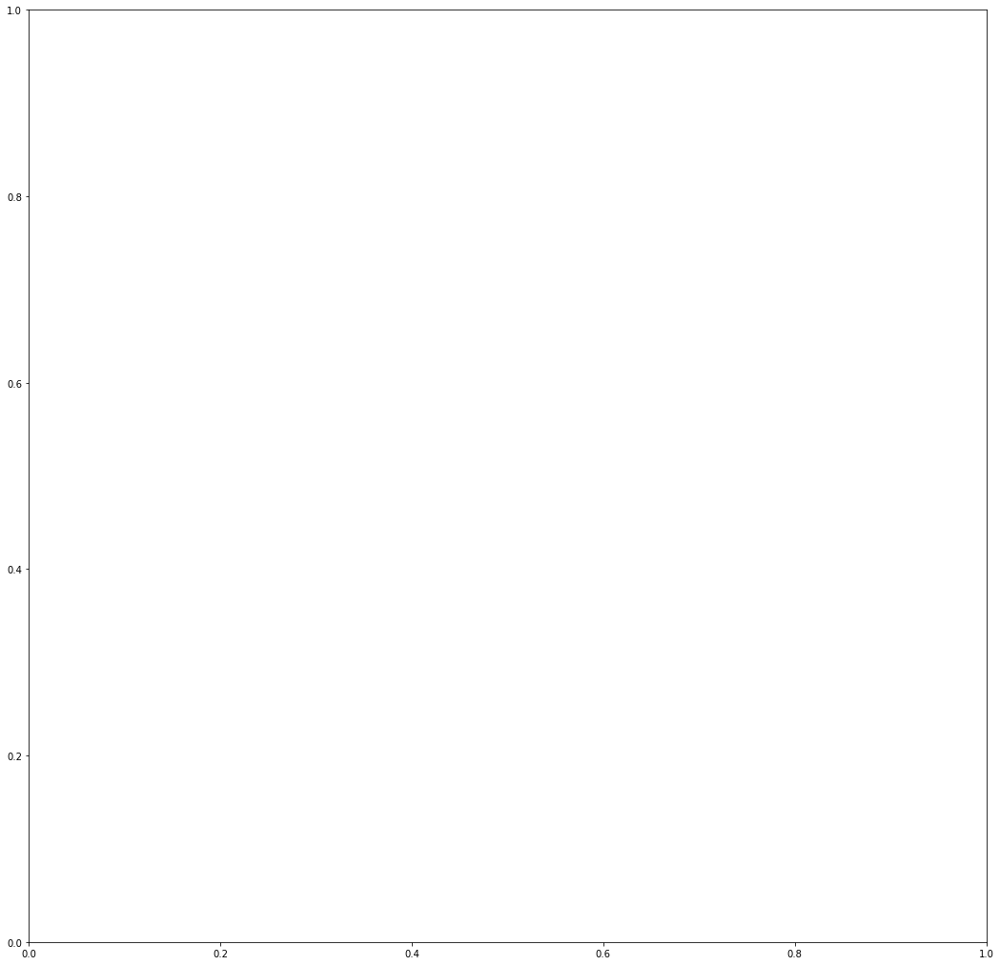

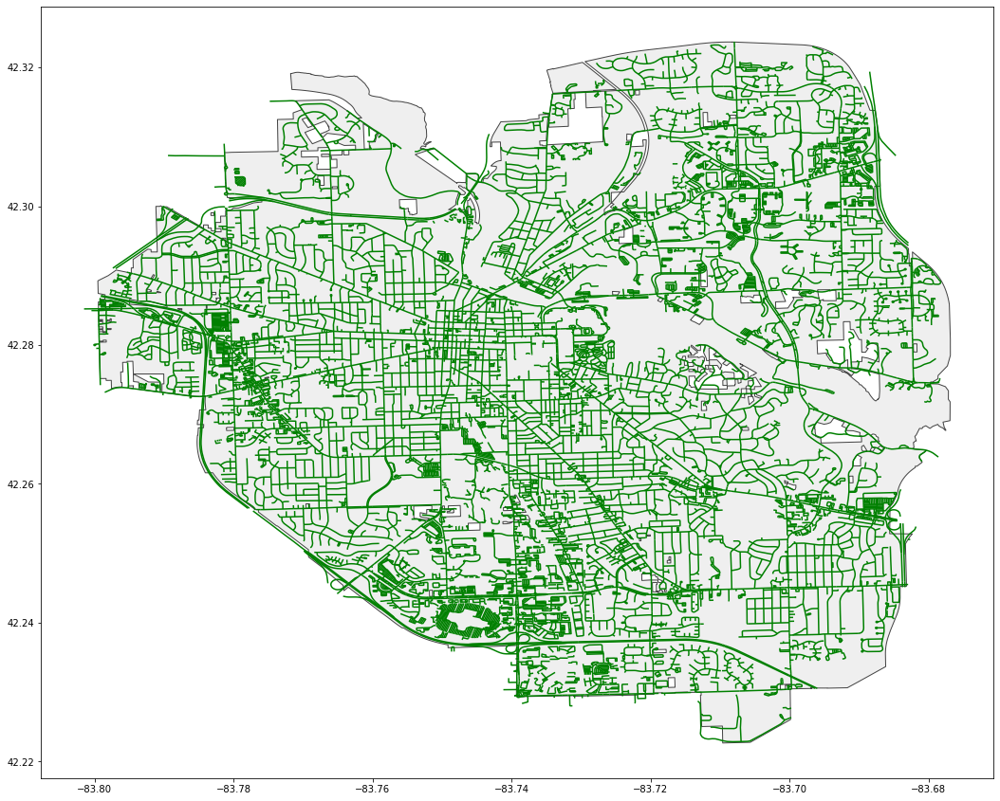

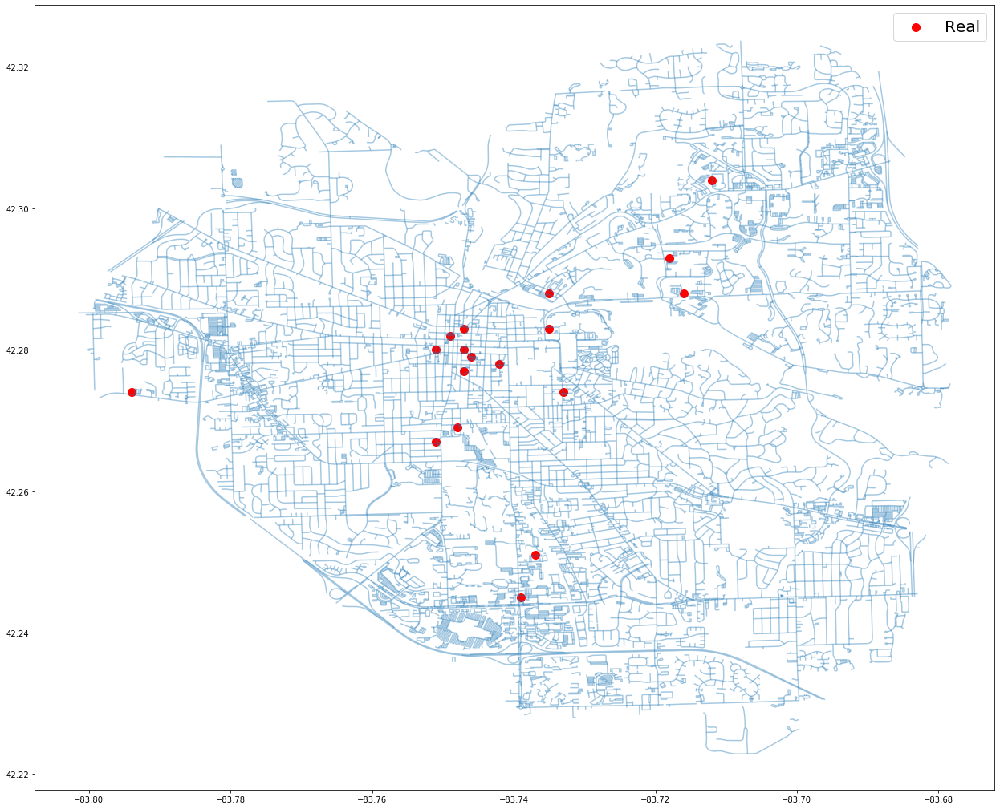

In [8]:
figure, axis = plt.subplots(figsize = (18, 18))
axis = stgo_shape.plot(figsize=(18,16), color='#EFEFEF', edgecolor='#444444')
car_roads.plot(ax=axis,color='green',markersize=0.5)

df = pd.DataFrame(
    {'Latitude': [42.28, 42.282, 42.278, 42.283, 42.28, 42.277, 42.274, 42.279, 42.274, 42.245, 42.251, 42.267, 42.269, 42.288, 42.283, 42.288, 42.293, 42.304],
     'Longitude': [-83.751, -83.749, -83.742, -83.747, -83.747, -83.747, -83.733, -83.746, -83.794, -83.739, -83.737, -83.751, -83.748, -83.735, -83.735, -83.716, -83.718, -83.712]})
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.Longitude, df.Latitude))
fig, ax = plt.subplots(figsize = (22, 18))
# We can now plot our ``GeoDataFrame``.
car_roads.plot(ax = ax, alpha = 0.4)
gdf.plot(ax=ax, color='red', markersize = 100, label= "Real", marker = "o")
plt.legend(prop = {'size' : 20})

plt.show()

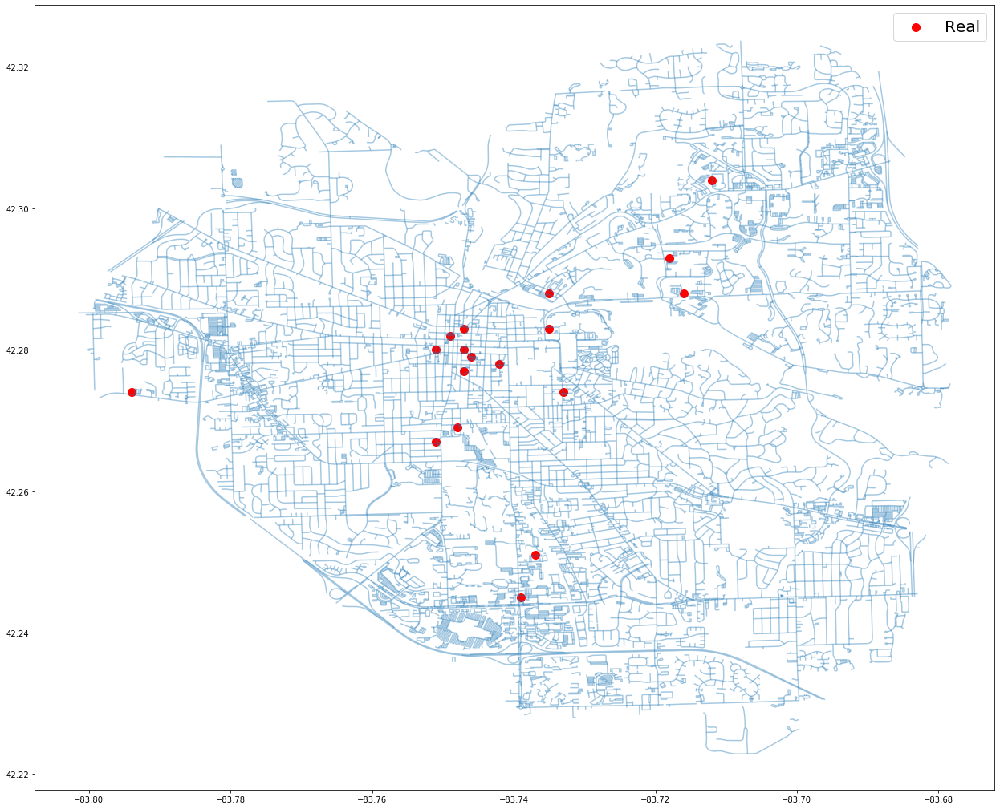

In [9]:
df = pd.DataFrame(
    {'Latitude': [42.28, 42.282, 42.278, 42.283, 42.28, 42.277, 42.274, 42.279, 42.274, 42.245, 42.251, 42.267, 42.269, 42.288, 42.283, 42.288, 42.293, 42.304],
     'Longitude': [-83.751, -83.749, -83.742, -83.747, -83.747, -83.747, -83.733, -83.746, -83.794, -83.739, -83.737, -83.751, -83.748, -83.735, -83.735, -83.716, -83.718, -83.712]})
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.Longitude, df.Latitude))
fig, ax = plt.subplots(figsize = (22, 18))
# We can now plot our ``GeoDataFrame``.
car_roads.plot(ax = ax, alpha = 0.4)
gdf.plot(ax=ax, color='red', markersize = 100, label= "Real", marker = "o")
plt.legend(prop = {'size' : 20})


plt.show()

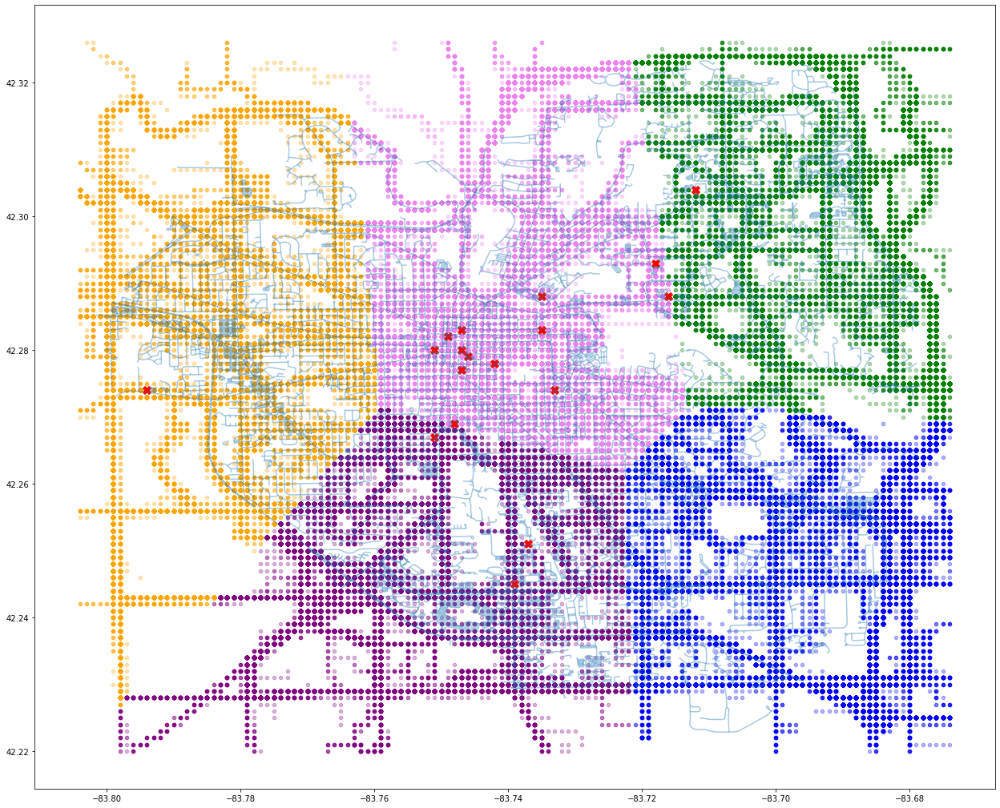

In [10]:
import glob
from shapely.geometry import shape,mapping, Point, Polygon, MultiPolygon

path = r'clusters\cluster0'

def getGeoData(path):
    all_files = glob.glob(path+"/*.csv")
    columnNames = ["Latitudes","Longitudes"]
    li = []
    for filename in all_files:
        df = pd.read_csv(filename, names=columnNames)
        li.append(df)
    
    data = pd.concat(li, axis=0, ignore_index=True)
    geoData = gpd.GeoDataFrame(data,geometry=gpd.points_from_xy(data.Longitudes,data.Latitudes))
    return geoData

cluster1 = getGeoData(r'clusters\cluster0')
cluster2 = getGeoData(r'clusters\cluster1')
cluster3 = getGeoData(r'clusters\cluster2')
cluster4 = getGeoData(r'clusters\cluster3')
cluster5 = getGeoData(r'clusters\cluster4')

fig,ax = plt.subplots(figsize = (22, 18))
car_roads.plot(ax = ax, alpha = 0.4)
cluster1.plot(ax=ax, color='green', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster2.plot(ax=ax, color='blue', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster3.plot(ax=ax, color='orange', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster4.plot(ax=ax, color='violet', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster5.plot(ax=ax, color='purple', markersize = 20, label= "Real", marker = "o",alpha = 0.3)

#Plotting Actual Charging Stations
gdf.plot(ax=ax, color='red', markersize = 100, label= "Actual Charging Stations", marker = "X")
#plt.legend(prop = {'size' : 20})

plt.show()

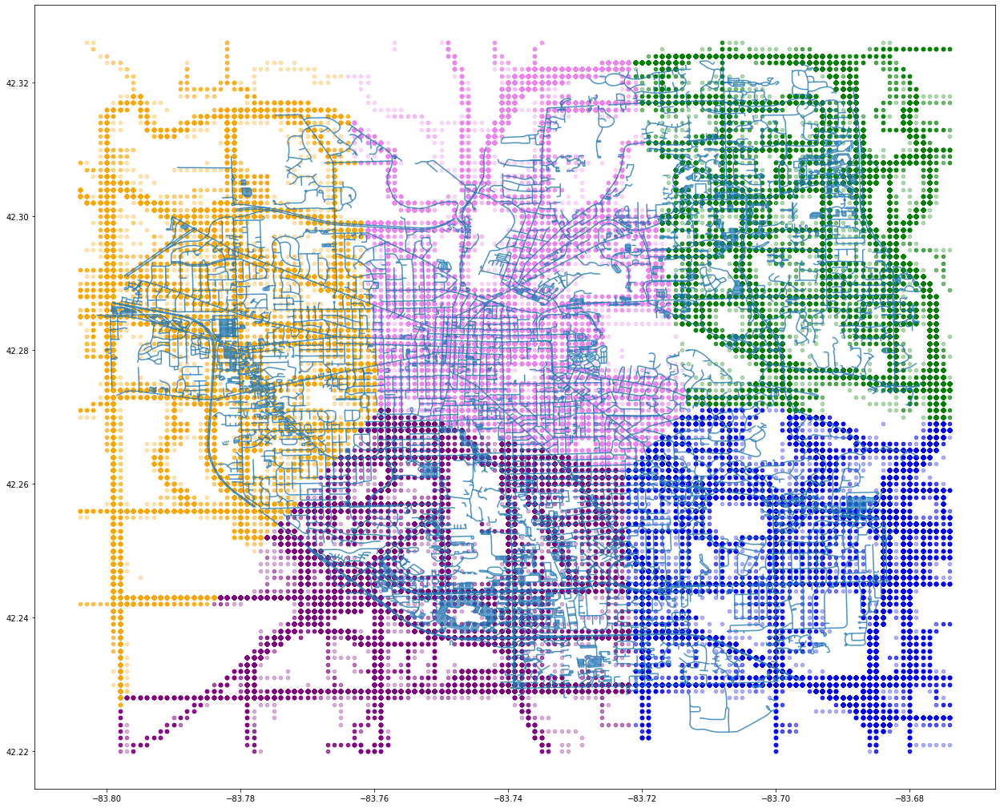

In [11]:
fig,ax = plt.subplots(figsize = (22, 18))
car_roads.plot(ax = ax, alpha = 0.8)
cluster1.plot(ax=ax, color='green', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster2.plot(ax=ax, color='blue', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster3.plot(ax=ax, color='orange', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster4.plot(ax=ax, color='violet', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster5.plot(ax=ax, color='purple', markersize = 20, label= "Real", marker = "o",alpha = 0.3)

In [12]:
cluster0_0 = getGeoData(r'clusters\cluster0_0')
cluster0_1 = getGeoData(r'clusters\cluster0_1')
cluster0_2 = getGeoData(r'clusters\cluster0_2')
cluster0_3 = getGeoData(r'clusters\cluster0_3')

cluster1_0 = getGeoData(r'clusters\cluster1_0')
cluster1_1 = getGeoData(r'clusters\cluster1_1')
cluster1_2 = getGeoData(r'clusters\cluster1_2')
cluster1_3 = getGeoData(r'clusters\cluster1_3')

cluster2_0 = getGeoData(r'clusters\cluster2_0')
cluster2_1 = getGeoData(r'clusters\cluster2_1')
cluster2_2 = getGeoData(r'clusters\cluster2_2')
cluster2_3 = getGeoData(r'clusters\cluster2_3')

cluster3_0 = getGeoData(r'clusters\cluster3_0')
cluster3_1 = getGeoData(r'clusters\cluster3_1')
cluster3_2 = getGeoData(r'clusters\cluster3_2')
cluster3_3 = getGeoData(r'clusters\cluster3_3')

cluster4_0 = getGeoData(r'clusters\cluster4_0')
cluster4_1 = getGeoData(r'clusters\cluster4_1')
cluster4_2 = getGeoData(r'clusters\cluster4_2')
cluster4_3 = getGeoData(r'clusters\cluster4_3')

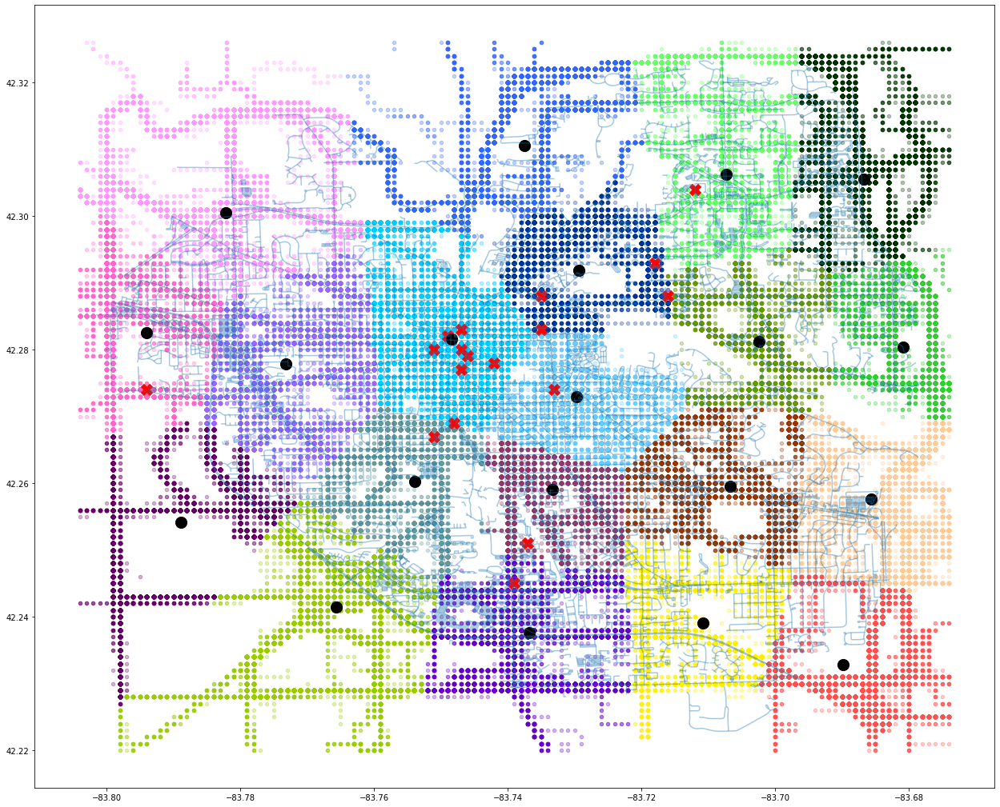

In [13]:
fig,ax = plt.subplots(figsize = (22, 18))
car_roads.plot(ax = ax, alpha = 0.4)
cluster0_0.plot(ax=ax, color='#003300', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster0_1.plot(ax=ax, color='#33cc33', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster0_2.plot(ax=ax, color='#669900', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster0_3.plot(ax=ax, color='#66ff66', markersize = 20, label= "Real", marker = "o",alpha = 0.3)

cluster1_0.plot(ax=ax, color='#993300', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster1_1.plot(ax=ax, color='#fff000', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster1_2.plot(ax=ax, color='#ffcc99', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster1_3.plot(ax=ax, color='#ff5050', markersize = 20, label= "Real", marker = "o",alpha = 0.3)

cluster2_0.plot(ax=ax, color='#660066', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster2_1.plot(ax=ax, color='#9966ff', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster2_2.plot(ax=ax, color='#ff66cc', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster2_3.plot(ax=ax, color='#ff99ff', markersize = 20, label= "Real", marker = "o",alpha = 0.3)

cluster3_0.plot(ax=ax, color='#003399', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster3_1.plot(ax=ax, color='#00ccff', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster3_2.plot(ax=ax, color='#3366ff', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster3_3.plot(ax=ax, color='#66ccff', markersize = 20, label= "Real", marker = "o",alpha = 0.3)

cluster4_0.plot(ax=ax, color='#99cc00', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster4_1.plot(ax=ax, color='#669999', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster4_2.plot(ax=ax, color='#6600cc', markersize = 20, label= "Real", marker = "o",alpha = 0.3)
cluster4_3.plot(ax=ax, color='#993366', markersize = 20, label= "Real", marker = "o",alpha = 0.3)

gdf.plot(ax=ax, color='red', markersize = 200, label= "Actual Charging Stations", marker = "X")


df2 = pd.DataFrame(
    {'Latitude': [42.30551812,42.2804154,42.28118455,42.30621963,42.25957186,42.2390289,42.25760157,42.23276832,42.25419974,42.27788722,42.28258279,42.30048607,42.29182689,42.28151156,42.31057609,42.27296718,42.24141734,42.26019987,42.23763725,42.25903899 ],
     'Longitude': [-83.68669846,-83.68078942,-83.70237542,-83.70731494,-83.70668484,-83.71073432,-83.68560828,-83.68984542,-83.78886269,-83.77315411,-83.79401804,-83.78218441,-83.72938078,-83.74840524,-83.73745629,-83.72966835,-83.76568808,-83.75393108,-83.73671464,-83.73326181 ]})

gdff = gpd.GeoDataFrame(df2, geometry=gpd.points_from_xy(df2.Longitude, df2.Latitude))
gdff.plot(ax=ax, color='black', markersize = 200, label= "Suggested Charging Locations", marker = "o")

In [14]:
import osmnx as ox
from shapely.geometry import Point, Polygon
from shapely.geometry import box
from pyproj import Proj
import networkx as nx

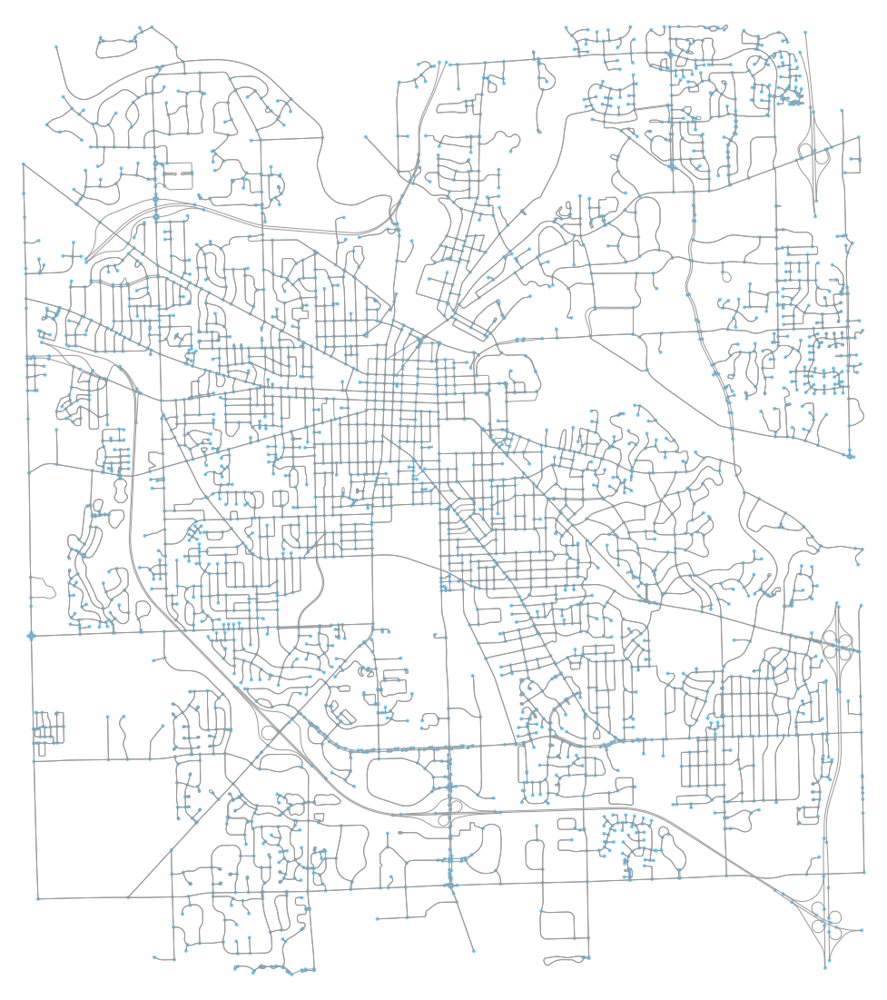

In [15]:
place_name = "Ann Arbor, Michigan, USA"
graph = ox.graph_from_bbox(42.32, 42.22, -83.68, -83.80, network_type='drive')
fig, ax = ox.plot_graph(graph, fig_height=20)

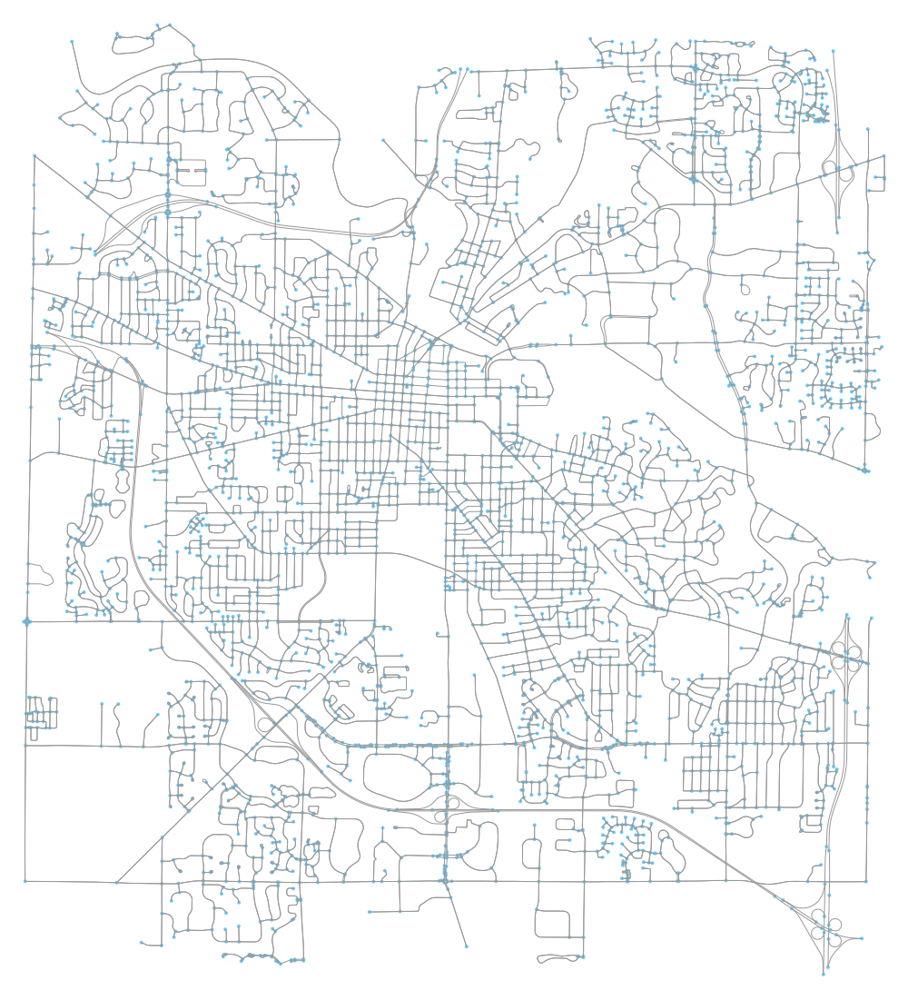

<Figure size 432x288 with 0 Axes>

In [16]:
edges = ox.graph_to_gdfs(graph, nodes=False, edges=True)
graph_proj = ox.project_graph(graph)
fig, ax = ox.plot_graph(graph_proj, fig_height=20)
plt.tight_layout()

In [17]:
nodes_proj, edges_proj = ox.graph_to_gdfs(graph_proj, nodes=True, edges=True)
bbox = box(*edges_proj.unary_union.bounds)

myProj = Proj("+proj=utm +zone=17T, +north +ellps=WGS84 +datum=WGS84 +units=m +no_defs")
lon_,lat_ = myProj(-83.78,42.24) 
orig_point = Point(lon_, lat_)

nodes_proj['x'] = nodes_proj.x.astype(float)
maxx = nodes_proj['x'].max()
target_loc = nodes_proj.loc[nodes_proj['x']==maxx, :]
target_point = target_loc.geometry.values[0]
print(orig_point)
print(target_point)

POINT (270625.358832831 4680166.023014229)
POINT (279050.2586532974 4687216.418635613)


In [18]:
from shapely.geometry import shape,mapping, Point, Polygon, MultiPolygon
orig_xy = (orig_point.y, orig_point.x)
target_xy = (target_point.y, target_point.x)

RealChargingLocationNodes = []
for i,j in df.iterrows():
    myProj = Proj("+proj=utm +zone=17T, +north +ellps=WGS84 +datum=WGS84 +units=m +no_defs")
    lon_,lat_ = myProj(j[1], j[0]) 
    tempPoint = Point(lon_, lat_)
    temp_xy = (tempPoint.y, tempPoint.x)
    tempNode= ox.get_nearest_node(graph_proj, temp_xy, method='euclidean')
    print(tempNode)
    RealChargingLocationNodes.append(tempNode)

CustomChargingStationsNodes = []
for i,j in df2.iterrows():
    myProj = Proj("+proj=utm +zone=17T, +north +ellps=WGS84 +datum=WGS84 +units=m +no_defs")
    lon_,lat_ = myProj(j[1], j[0]) 
    tempPoint = Point(lon_, lat_)
    temp_xy = (tempPoint.y, tempPoint.x)
    tempNode= ox.get_nearest_node(graph_proj, temp_xy, method='euclidean')
    print(tempNode)
    CustomChargingStationsNodes.append(tempNode)

    
orig_node = ox.get_nearest_node(graph_proj, orig_xy, method='euclidean')
target_node = ox.get_nearest_node(graph_proj, target_xy, method='euclidean')
o_closest = nodes_proj.loc[orig_node]
t_closest = nodes_proj.loc[target_node]
print(target_xy)
print(orig_xy)
print(orig_point.x)
print(orig_point.y)
print(orig_node)
print(target_node)
print(RealChargingLocationNodes)

62486075
62514378
62554407
62518080
62559632
62559637
62501248
4249186582
62512905
62500688
62491051
62488688
62564440
62499613
62508722
62469767
62546709
62532012
69907828
62573993
5050082066
62548288
62540682
1729321842
62470810
62502877
4397603581
62482419
62538975
3793845361
62621544
62527484
6442499224
62531260
62617521
62492560
62491092
62571911
(4687216.418635613, 279050.25865329744)
(4680166.023014229, 270625.358832831)
270625.358832831
4680166.023014229
62561669
4391425501
[62486075, 62514378, 62554407, 62518080, 62559632, 62559637, 62501248, 4249186582, 62512905, 62500688, 62491051, 62488688, 62564440, 62499613, 62508722, 62469767, 62546709, 62532012]


In [19]:
od_nodes = gpd.GeoDataFrame([o_closest, t_closest], geometry='geometry', crs=nodes_proj.crs)

route= nx.shortest_path(G=graph_proj, source=orig_node, target=target_node, weight='length')
length = nx.shortest_path_length(G=graph_proj, source=orig_node, target=target_node, weight='length')
print(route)
print(length)

[62561669, 62483880, 62561639, 62507783, 62507779, 62488274, 62503312, 4400862110, 62503311, 62476299, 3692621332, 62477006, 4132465162, 62503298, 62503294, 62503286, 62503282, 62503271, 62503267, 62499418, 62622986, 62492569, 62550570, 62592830, 62581291, 62488688, 62583349, 62622975, 62487316, 62622968, 62611536, 62576512, 62578784, 62536102, 62496379, 62533135, 62530912, 62509246, 62601699, 62501419, 62486064, 62563769, 62527484, 62514378, 62490467, 62537809, 62596818, 62551656, 62484936, 62484938, 1367865819, 62484828, 62484830, 1367865777, 62501550, 62494762, 62499610, 62501571, 62501598, 62496869, 62501620, 62500560, 62501623, 62501625, 62501636, 62501649, 767530322, 62515808, 62546815, 62497009, 62469763, 62532012, 62477148, 62500824, 62599231, 3705291558, 62590703, 62473998, 62606176, 62481221, 62474166, 69907839, 69907739, 62479267, 62483250, 62613626, 62469635, 62469639, 4391425501]
13227.172999999999


In [20]:
realSum = 0
tempDistances = []
for x in route:
    for y in RealChargingLocationNodes:
        tempDistances.append(nx.shortest_path_length(G=graph_proj, source=x, target=y, weight='length'))
    realSum += min(tempDistances)
    print(realSum)
    tempDistances.clear()
print(realSum)
print(realSum / len(route))

3940.636000000001
7655.841000000001
11109.798
14489.795
17709.475000000002
20795.664
23544.612
26194.297
28759.380999999998
31216.856999999996
33308.024999999994
35347.893
37371.797999999995
39320.848999999995
41324.85999999999
43077.611999999994
44739.924999999996
46157.100999999995
47502.045999999995
48656.431
49780.221999999994
50863.937999999995
51145.64599999999
51344.045999999995
51441.84299999999
51441.84299999999
51523.49199999999
51626.91499999999
51831.856999999996
52054.551999999996
52298.585999999996
52618.488
53054.731
53533.869
54025.893
54513.579999999994
54856.91999999999
55049.53299999999
55173.06799999999
55422.13999999999
55626.736999999994
55730.14899999999
55833.81599999999
55833.81599999999
55934.91499999999
56217.757999999994
56400.113
56682.922999999995
57019.10999999999
57543.95599999999
58211.200999999994
58863.147999999994
59476.19299999999
60184.68499999999
60828.74799999999
61335.98399999999
61779.342999999986
62269.30599999999
62867.99499999999
63758.82999

In [21]:
realSum2 = 0
tempDistances = []
for x in route:
    for y in CustomChargingStationsNodes:
        tempDistances.append(nx.shortest_path_length(G=graph_proj, source=x, target=y, weight='length'))
    realSum2 += min(tempDistances)
    print(realSum2)
    tempDistances.clear()
print(realSum2)
print(realSum2 / len(route))

1310.6470000000002
2395.8630000000003
3219.831
3969.839
4559.53
5015.73
5134.688999999999
5352.910999999999
5655.695999999999
6066.088999999999
6842.789999999999
7670.790999999999
8514.755
9458.613
10736.797999999999
11763.723999999998
12700.211
13391.561
14010.68
14439.239
14837.204
15195.094
16354.991999999998
17598.197999999997
18942.006999999998
20383.612999999998
21906.868
23448.395999999997
24888.405
26243.615999999998
27577.487999999998
28831.103
29926.310999999998
30978.623999999996
31992.857999999997
32955.875
33774.545
34355.155
34866.687
35252.682
35457.314
35560.761
35560.761
35664.428
35869.194
36255.704000000005
36745.14600000001
37335.043000000005
37978.317
38810.25
39740.433
40655.318
41531.301
42502.731
43409.731999999996
44653.698
45838.691
46967.992
48206.019
49736.192
51778.86
53919.956
56186.958999999995
58421.420999999995
60319.973
62065.356
63737.976
65100.217000000004
66447.098
67750.766
68813.887
69637.69
70057.706
70582.70700000001
71259.001
72187.231
73125.36

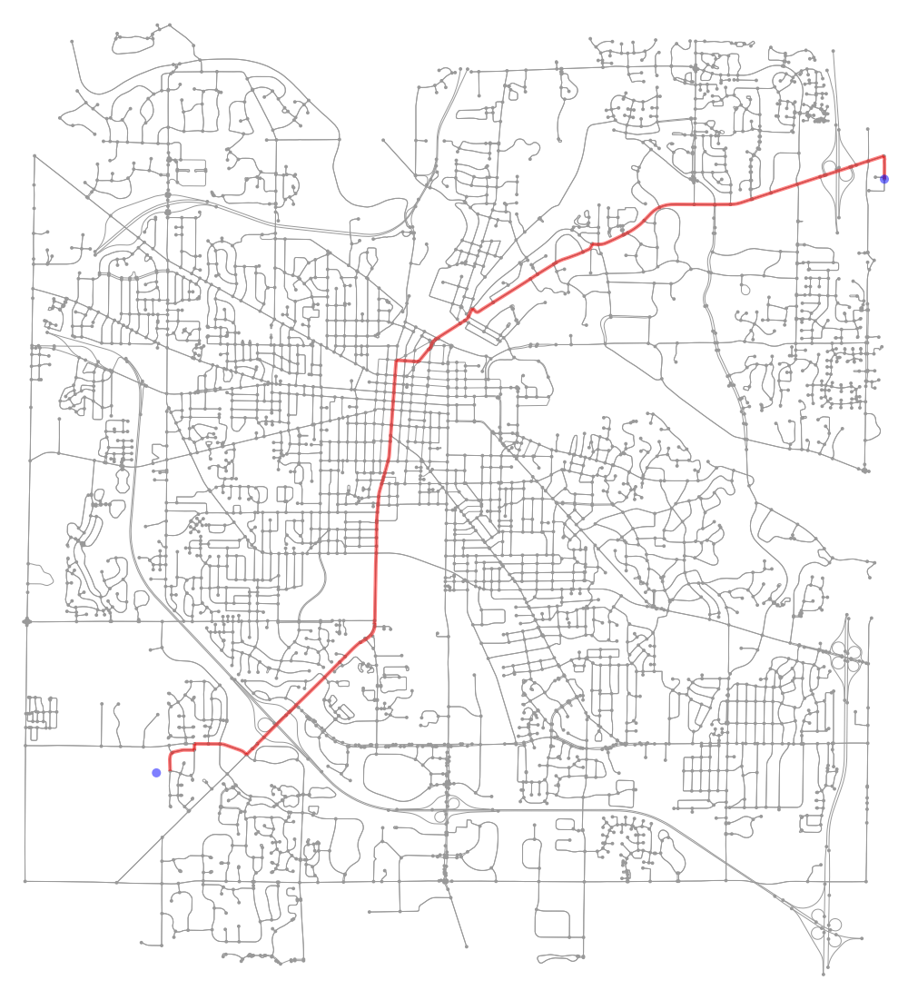

<Figure size 432x288 with 0 Axes>

In [22]:
fig, ax = ox.plot_graph_route(graph_proj, route, fig_height=20, origin_point=orig_xy, destination_point=target_xy)
plt.tight_layout()

In [24]:
import random
myProj = Proj("+proj=utm +zone=17T, +north +ellps=WGS84 +datum=WGS84 +units=m +no_defs")
realSum = 0
totalRealSum = 0
customSum = 0
totalCustomSum = 0
tempDistances = []
count = 0
lon = 0
lat = 0

for i in range(0, 199):
     # random.uniform(42.3211, 42.2199)
    #random.uniform(-83.6811, -83.799)
    lon = random.uniform(-83.6811, -83.799)
    lat = random.uniform(42.3211, 42.2199)
    lon_,lat_ = myProj(lon, lat) 
    orig_point = Point(lon_, lat_)
    print(lon)
    print(lat)

    lon = random.uniform(-83.6811, -83.799)
    lat = random.uniform(42.3211, 42.2199)
    lon_,lat_ = myProj(lon, lat) 
    target_point = Point(lon_, lat_)
    print(lon)
    print(lat)

    orig_xy = (orig_point.y, orig_point.x)
    target_xy = (target_point.y, target_point.x)

    orig_node = ox.get_nearest_node(graph_proj, orig_xy, method='euclidean')
    target_node = ox.get_nearest_node(graph_proj, target_xy, method='euclidean')
    o_closest = nodes_proj.loc[orig_node]
    t_closest = nodes_proj.loc[target_node]

    try:
        route= nx.shortest_path(G=graph_proj, source=orig_node, target=target_node, weight='length')
        
        realSum = 0
        customSum = 0
        
        for x in route:
            for y in RealChargingLocationNodes:
                tempDistances.append(nx.shortest_path_length(G=graph_proj, source=x, target=y, weight='length'))
            realSum += min(tempDistances)
            tempDistances.clear()
        # print(realSum)
        # print(realSum / len(route))
        totalRealSum += realSum / len(route)
        print(totalRealSum / (i + 1))

        for x in route:
            for y in CustomChargingStationsNodes:
                tempDistances.append(nx.shortest_path_length(G=graph_proj, source=x, target=y, weight='length'))
            customSum += min(tempDistances)
            tempDistances.clear()
        #print(customSum)
        # print(customSum / len(route))
        totalCustomSum += customSum / len(route)
        print(totalCustomSum / (i + 1))

        if customSum < realSum:
            count += 1

        print(i + 1)
        print(count)
        print(count/(i + 1))
        print("------------------------------------")
    except:
        pass

-83.69649960270517
42.27343638070721
-83.79533135657881
42.275274713828956
1001.8786986301375
-83.68784564344088
42.27562757750281
-83.74016652333412
42.27134745198566
1185.4023731245925
434.5115952380952
2
1
0.5
------------------------------------
-83.69725705474777
42.32019899720683
-83.7558762329734
42.237774034959
1274.1269040527586
662.4863816738816
3
2
0.6666666666666666
------------------------------------
-83.7238770396107
42.25173167318135
-83.77399614953355
42.301639928558615
1299.8351972703383
802.2846484348984
4
3
0.75
------------------------------------
-83.72856367481099
42.31896804779734
-83.79410633641795
42.27823315610343
1404.782615350517
826.7024283369598
5
4
0.8
------------------------------------
-83.77565866254837
42.22042114667534
-83.72888654310874
42.2867525531782
1403.4959489032087
851.1279875030219
6
5
0.8333333333333334
------------------------------------
-83.78210935584427
42.30773074207268
-83.73665694647892
42.286985644838296
1501.8580085837027
840.53

1479.2238418063685
1061.6181279502748
53
34
0.6415094339622641
------------------------------------
-83.77637089049423
42.301756098994936
-83.77291964759587
42.28756105882995
1512.3289689642752
1054.5891525869981
54
35
0.6481481481481481
------------------------------------
-83.68914135124685
42.275385905037474
-83.78070245418458
42.27062031695508
1501.8299106060022
1050.9441279271673
55
36
0.6545454545454545
------------------------------------
-83.76520321026295
42.27969275147873
-83.75226804945801
42.29385252163965
1491.1170957340696
1050.2592179046583
56
36
0.6428571428571429
------------------------------------
-83.6928822231969
42.23138023838724
-83.74932134333542
42.315167294291605
1505.9017135720685
1056.4874932484363
57
37
0.6491228070175439
------------------------------------
-83.68399629955702
42.24790796621766
-83.74736075855662
42.23806645804354
1519.1181000312592
1067.455108086328
58
38
0.6551724137931034
------------------------------------
-83.78627067359032
42.2218111

1698.8516448472142
1149.8033899392785
101
72
0.7128712871287128
------------------------------------
-83.68814444852966
42.22963383869356
-83.79732975261096
42.2358874391897
1714.215392090245
1152.7248475691074
102
73
0.7156862745098039
------------------------------------
-83.69631935965634
42.31627598201518
-83.7887780598941
42.22702515501918
1710.5995998583765
1151.9144044644772
103
74
0.7184466019417476
------------------------------------
-83.7752238587558
42.23485569485582
-83.77008718999699
42.27618547875631
1717.7236235376226
1150.9402404191458
104
75
0.7211538461538461
------------------------------------
-83.68202771760375
42.30667300913489
-83.73759956174052
42.282320205283234
1711.2709223610739
1150.7434157484872
105
75
0.7142857142857143
------------------------------------
-83.79016765822492
42.24519687672539
-83.75346627288428
42.309758677769025
1710.1448840514267
1150.0630945549237
106
76
0.7169811320754716
------------------------------------
-83.73650797737513
42.2235

1768.1006644936326
1186.3433408811459
149
104
0.697986577181208
------------------------------------
-83.74501025309254
42.25438233765299
-83.75651381970336
42.28178536876519
1760.3244804937824
1185.491086565594
150
104
0.6933333333333334
------------------------------------
-83.73069199993186
42.26542261664428
-83.69378041941238
42.2261961582143
1758.0522439181661
1186.9796208106945
151
105
0.695364238410596
------------------------------------
-83.69346563951046
42.2341689885054
-83.73327486927921
42.320818015491106
1759.6980680478355
1186.5989969283721
152
106
0.6973684210526315
------------------------------------
-83.68116859555813
42.24431959583996
-83.68125703362306
42.24858256860867
1781.6991699995922
1188.8731037022608
153
107
0.6993464052287581
------------------------------------
-83.73286696201534
42.22946435822173
-83.70891838272372
42.226299577677764
1790.5939372939672
1193.8459450202113
154
108
0.7012987012987013
------------------------------------
-83.77158292511044
42

1792.8568547256964
1186.1404331955707
196
138
0.7040816326530612
------------------------------------
-83.73027403882155
42.27000589586306
-83.7788013741222
42.27577746245296
1787.5386129715896
1183.6444031835795
197
139
0.7055837563451777
------------------------------------
-83.71175132447718
42.292994501158155
-83.74254486362925
42.226758666830385
1782.5431713778914
1183.7033284037343
198
139
0.702020202020202
------------------------------------
-83.70306181759254
42.28341184905165
-83.72010810233756
42.29110272020407
